# Zafer Ulgur - 2022325

## MSc in Applied Software Development
## Information Retrieval and Data Mining

### "The prevalence of ratings" in terms of the distribution of user ratings

#### CRISP-DM

In [1]:
!pip install tweepy
!pip install textblob
!pip install WordCloud

Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable


In [2]:
import pandas as pd

# CSV import file
df = pd.read_csv("https://archive.ics.uci.edu/ml/machine-learning-databases/00485/google_review_ratings.csv")

In [3]:
# Fix data
import numpy as np
for r in df:
    if r != 'User':
        df[r]= pd.to_numeric(df[r],errors='coerce')
        df[r] = df[r].astype(float)

#### Q1: to determine in which ranges the ratings are common and in which ranges they are rare in the dataset.

#### show distribution of ratings

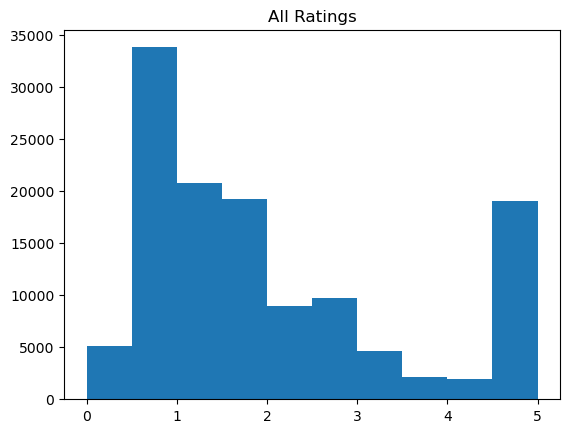

In [4]:
import matplotlib.pyplot as plt

#get all rating points
ratings = df.iloc[:, 2:]

#combine all rating points
all_ratings = ratings.values.flatten()

#histogram
plt.hist(all_ratings)
plt.title("All Ratings")
plt.show()

#### to show users average ratings, show users average ratings by category

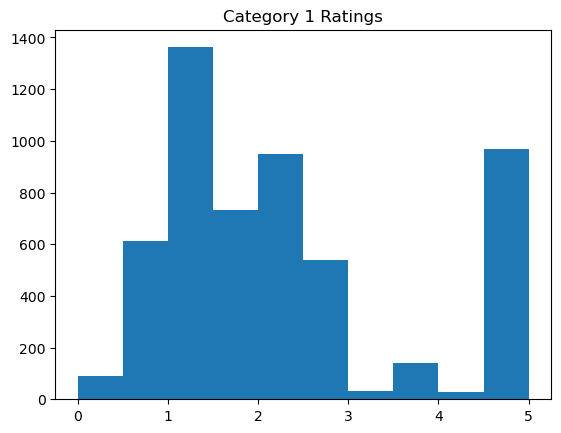

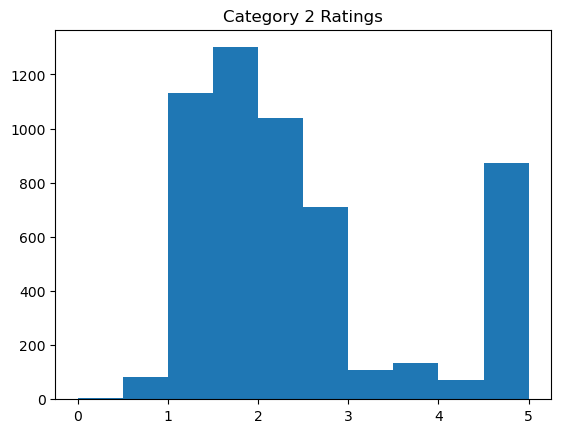

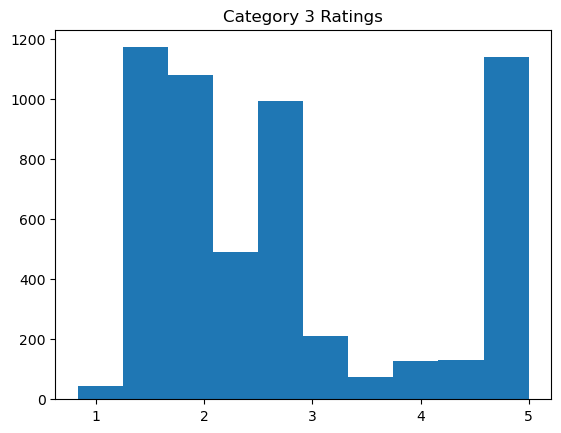

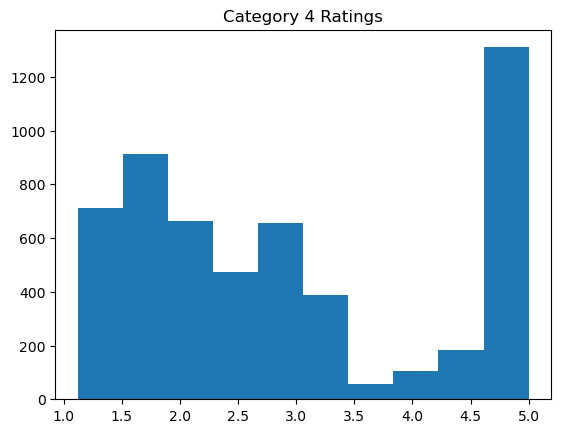

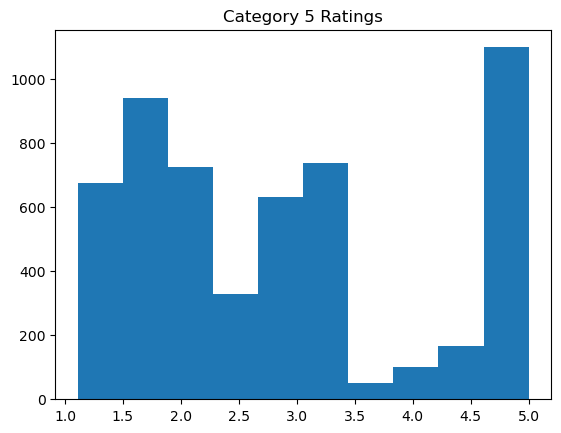

...

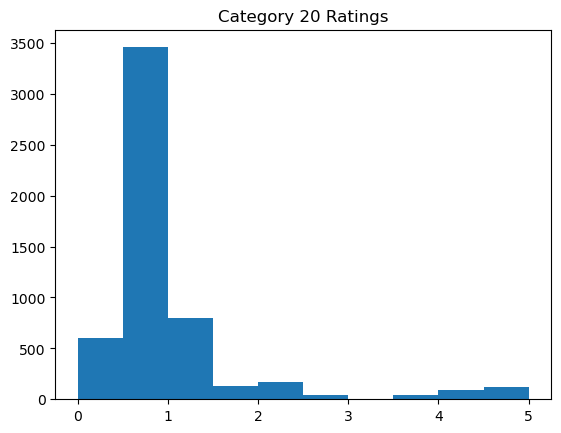

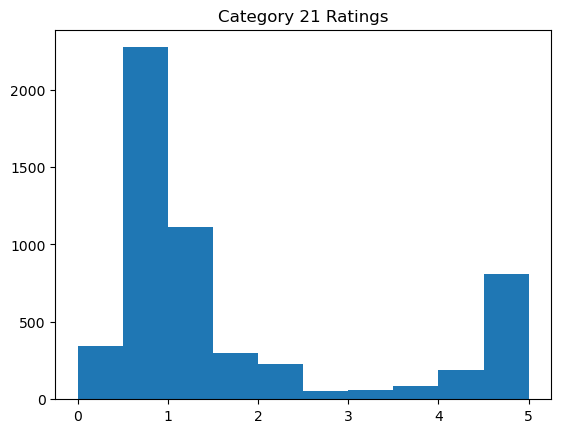

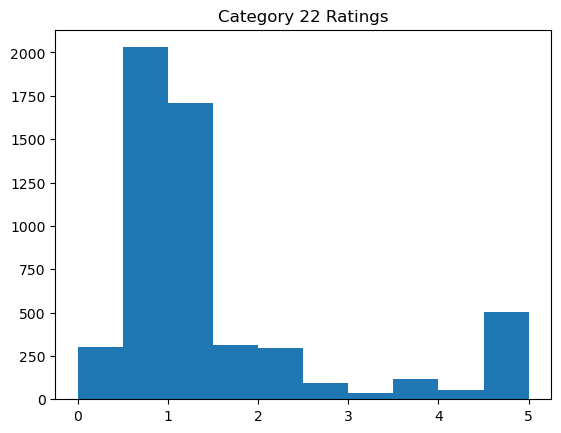

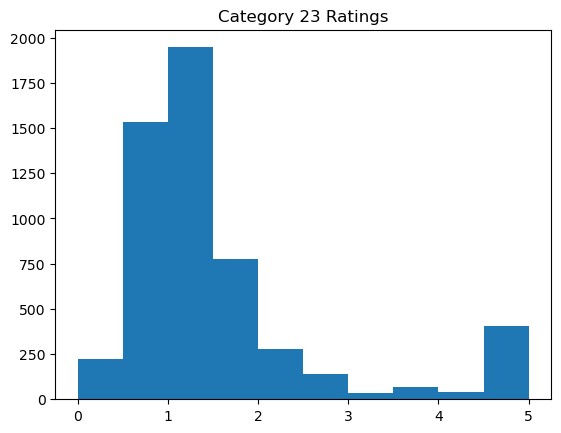

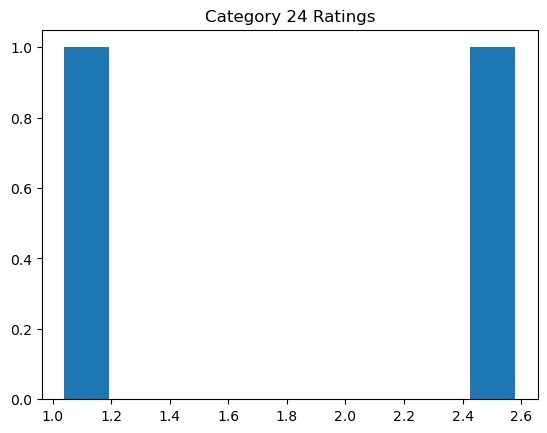

In [5]:
#number of categories
num_categories = ratings.shape[1]

#generate histogram for each category
for i in range(num_categories):
    category_ratings = ratings.iloc[:, i].values
    plt.hist(category_ratings)
    plt.title(f"Category {i+1} Ratings")
    plt.show()


#### Q2 : what are the other characteristics that determine the prevalence of ratings in the dataset, and how can we measure them?

In [6]:
#get users average rating
mean_ratings = ratings.mean(axis=1)

#### show the distribution of users average ratings

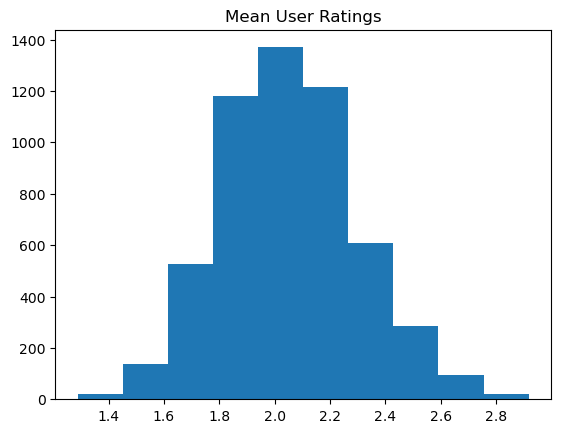

In [7]:
import matplotlib.pyplot as plt

#histogram
plt.hist(mean_ratings)
plt.title("Mean User Ratings")
plt.show()

#### crisp dm detail

In [8]:
#try to understand the dataset and describe the features found in the dataset
print(ratings.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5456 entries, 0 to 5455
Data columns (total 24 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Category 2   5456 non-null   float64
 1   Category 3   5456 non-null   float64
 2   Category 4   5456 non-null   float64
 3   Category 5   5456 non-null   float64
 4   Category 6   5456 non-null   float64
 5   Category 7   5456 non-null   float64
 6   Category 8   5456 non-null   float64
 7   Category 9   5456 non-null   float64
 8   Category 10  5456 non-null   float64
 9   Category 11  5455 non-null   float64
 10  Category 12  5455 non-null   float64
 11  Category 13  5456 non-null   float64
 12  Category 14  5456 non-null   float64
 13  Category 15  5456 non-null   float64
 14  Category 16  5456 non-null   float64
 15  Category 17  5456 non-null   float64
 16  Category 18  5456 non-null   float64
 17  Category 19  5456 non-null   float64
 18  Category 20  5456 non-null   float64
 19  Catego

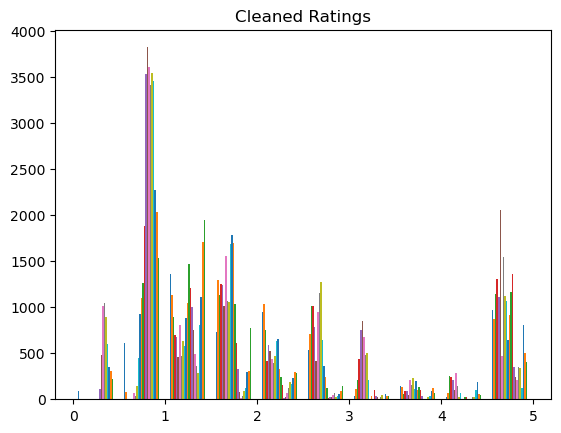

In [9]:
#limit rating scores between 0 and 5
cleaned_ratings = ratings.clip(0, 5)

#histogram
plt.hist(cleaned_ratings)
plt.title("Cleaned Ratings")
plt.show()

In [10]:
#limit rating scores between 0 and 5
cleaned_ratings = ratings.clip(0, 5)

#create the dataset to be used for data mining
mining_data = cleaned_ratings.reset_index(drop=True)

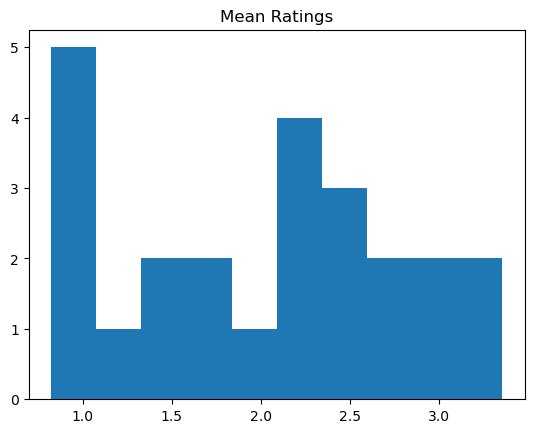

In [11]:
#average of rating scores
mean_ratings = mining_data.mean()

#histogram
plt.hist(mean_ratings)
plt.title("Mean Ratings")
plt.show()

In [12]:
#categories variable
categories = ['Churches', 'Resorts', 'Beaches', 'Parks', 'Theatres', 'Museums',
              'Malls', 'Zoo', 'Restaurants', 'Pubs/Bars', 'Local Services',
              'Burger/Pizza Shops', 'Hotels/Other Lodgings', 'Juice Bars', 'Art Galleries',
              'Dance Clubs', 'Swimming Pools', 'Gyms', 'Bakeries', 'Beauty & Spas',
              'Cafes', 'View Points', 'Monuments', 'Gardens']

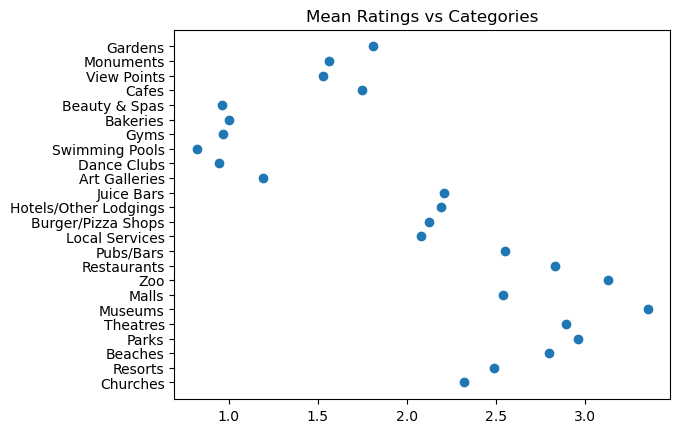

In [13]:
#average of rating scores
mean_ratings = mining_data.mean()

#scatterplot
plt.scatter(mean_ratings, categories)
plt.title("Mean Ratings vs Categories")
plt.show()

In [14]:
#add average rating column
df['Average Rating'] = df.mean(axis=1)

C:\Users\Zafer\AppData\Local\Temp\ipykernel_121600\262331830.py:2: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df['Average Rating'] = df.mean(axis=1)


<AxesSubplot:ylabel='Density'>

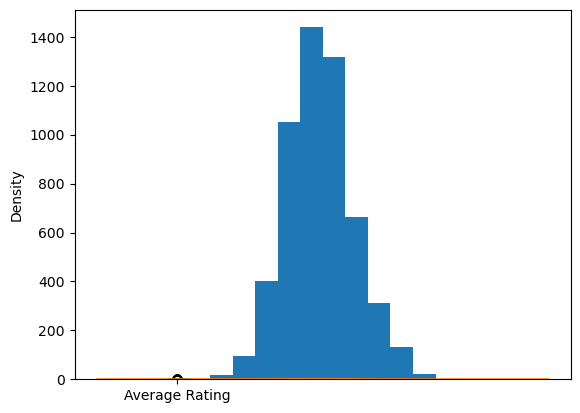

In [15]:
#generate a histogram showing the distribution of ratings
df['Average Rating'].plot.hist()

#create a box plot showing the distribution of ratings
df.boxplot(column='Average Rating')

#create a distribution curve showing the distribution of ratings
df['Average Rating'].plot.kde()

<AxesSubplot:>

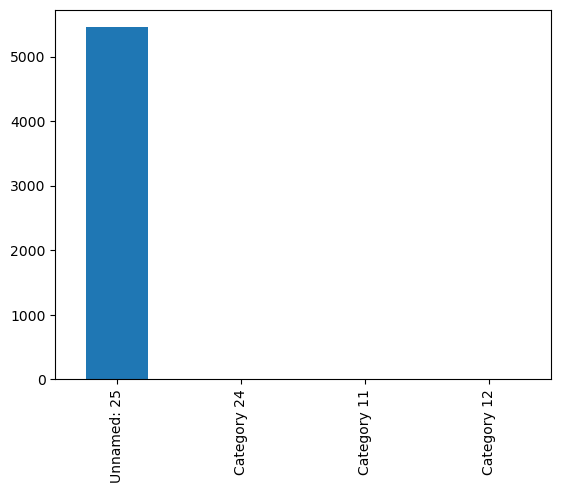

In [16]:
#fill in missing data:

#find the number of missing data
missing_data = df.isnull().sum().sort_values(ascending=False)

#find features with non-zero number of missing data
missing_data = missing_data[missing_data > 0]

#chart showing features with a nonzero number of missing data
missing_data.plot.bar()

#to fill in missing data, 
#perform the fill operation, 
#starting with the features with the largest number of missing data

#for example, fill in missing data 
#using average values for the Average Rating property
df['Average Rating'].fillna(df['Average Rating'].mean(), inplace=True)

#after filling in the missing data, 
#check the missing data count again
missing_data = df.isnull().sum().sort_values(ascending=False)
missing_data = missing_data[missing_data > 0]
missing_data.plot.bar()

array([[<AxesSubplot:title={'center':'Category 1'}>,
        <AxesSubplot:title={'center':'Category 2'}>,
        <AxesSubplot:title={'center':'Category 3'}>,
        <AxesSubplot:title={'center':'Category 4'}>,
        <AxesSubplot:title={'center':'Category 5'}>],
       [<AxesSubplot:title={'center':'Category 6'}>,
        <AxesSubplot:title={'center':'Category 7'}>,
        <AxesSubplot:title={'center':'Category 8'}>,
        <AxesSubplot:title={'center':'Category 9'}>,
        <AxesSubplot:title={'center':'Category 10'}>],
       [<AxesSubplot:title={'center':'Category 11'}>,
        <AxesSubplot:title={'center':'Category 12'}>,
        <AxesSubplot:title={'center':'Category 13'}>,
        <AxesSubplot:title={'center':'Category 14'}>,
        <AxesSubplot:title={'center':'Category 15'}>],
       [<AxesSubplot:title={'center':'Category 16'}>,
        <AxesSubplot:title={'center':'Category 17'}>,
        <AxesSubplot:title={'center':'Category 18'}>,
        <AxesSubplot:title={'cente

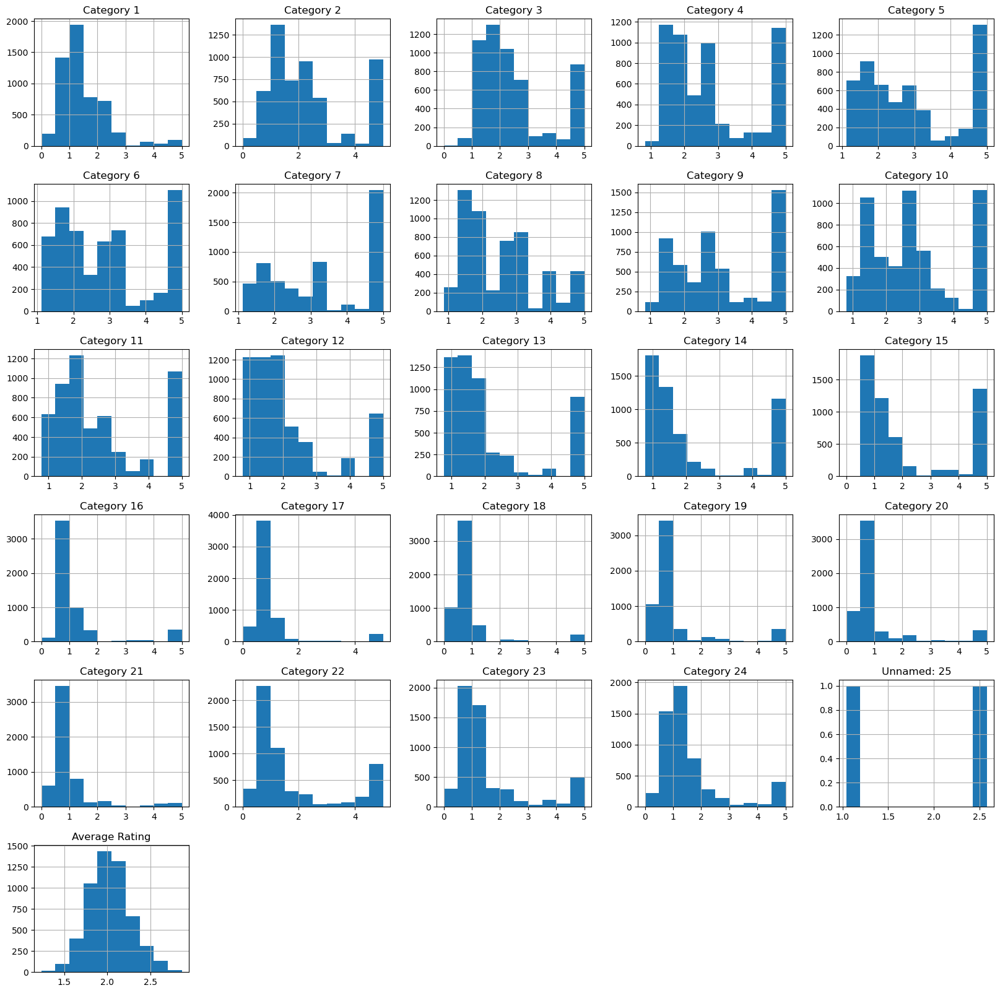

In [17]:
#the distribution of features
df.hist(figsize=(20,20))

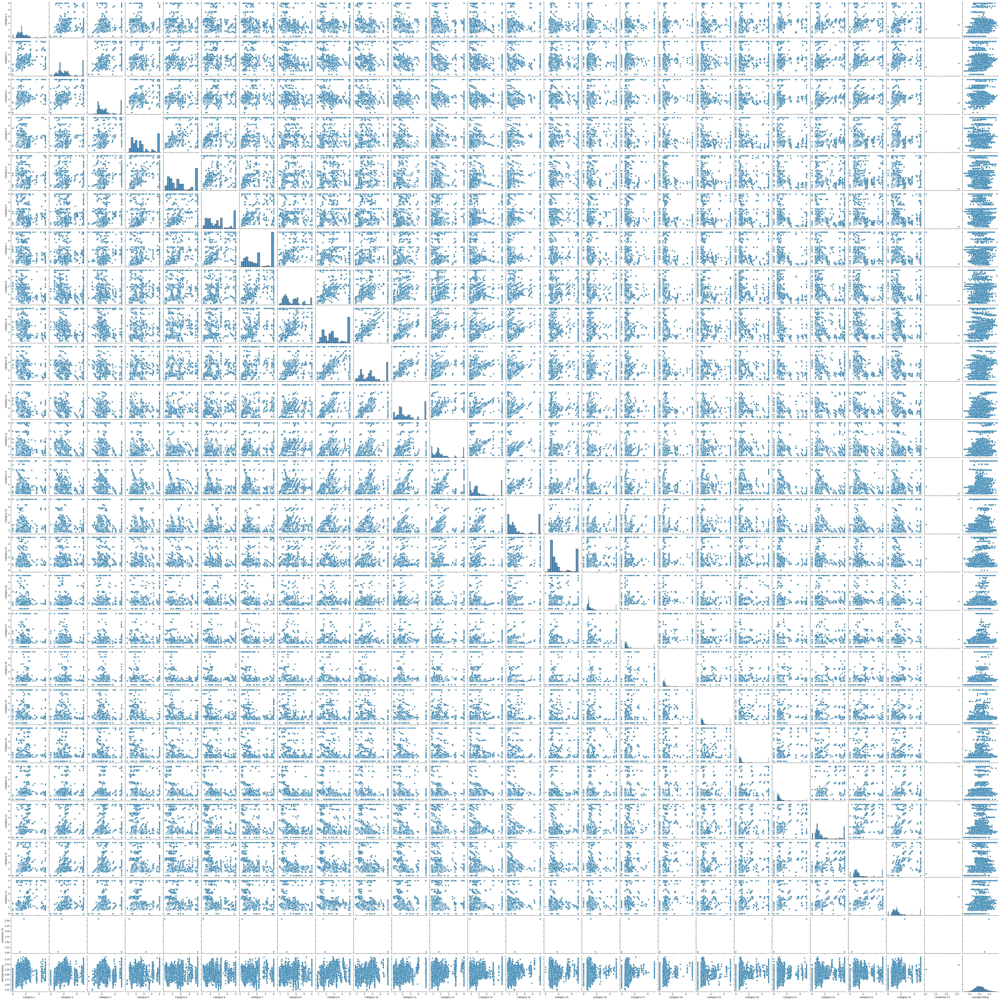

In [18]:
#the relationship between prevalence of rating scores and other characteristics
import seaborn as sns
sns.pairplot(df)

<AxesSubplot:>

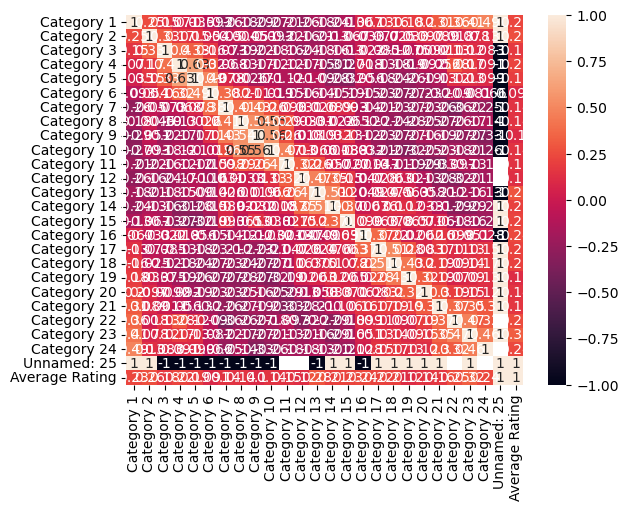

In [19]:
#correlation matrix showing the relationship between traits
corr = df.corr()
#a heatmap showing the correlation matrix
sns.heatmap(corr, xticklabels=corr.columns, yticklabels=corr.columns, annot=True)

In [20]:
#sort features by their correlation values 
#to select features that determine 
#the prevalence of rating scores
corr['Average Rating'].sort_values(ascending=False)

Average Rating    1.000000
Unnamed: 25       1.000000
Category 23       0.320693
Category 13       0.282056
Category 2        0.260942
Category 22       0.253518
Category 24       0.240485
Category 16       0.239513
Category 1        0.234116
Category 15       0.226197
Category 4        0.222231
Category 17       0.218540
Category 18       0.205952
Category 14       0.205887
Category 5        0.190287
Category 3        0.179496
Category 21       0.162356
Category 11       0.146744
Category 7        0.144063
Category 10       0.143183
Category 8        0.142778
Category 20       0.142500
Category 12       0.120924
Category 19       0.115262
Category 9        0.100106
Category 6        0.090601
Name: Average Rating, dtype: float64

In [21]:
# properties and target
X = df[['Category 5', 'Category 6', 'Category 15']]
y = df['Average Rating']

# test and train cluster
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

#modeling
from sklearn.linear_model import LinearRegression
model = LinearRegression()

#training
model.fit(X_train, y_train)

#make predictions on the test set
y_pred = model.predict(X_test)

#the accuracy of the predictions
from sklearn.metrics import mean_absolute_error, mean_squared_error
print("Mean Absolute Error:", mean_absolute_error(y_test, y_pred))
print("Mean Squared Error:", mean_squared_error(y_test, y_pred))


Mean Absolute Error: 0.17038509389592252
Mean Squared Error: 0.048284690142351795


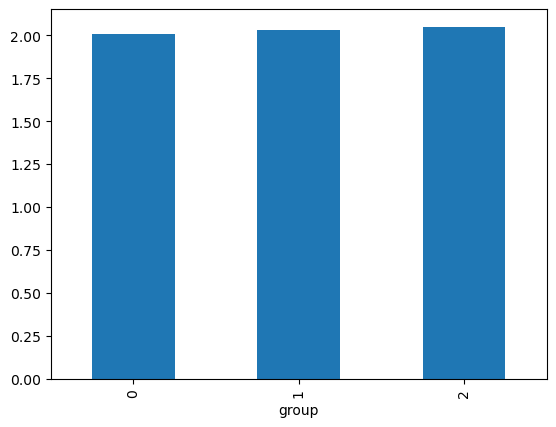

group
0    2.007580
1    2.032424
2    2.050242
Name: Average Rating, dtype: float64


In [22]:
import pandas as pd
import matplotlib.pyplot as plt

#cleaning and setting df for clustering
df2 = df
df2 = df2.drop('User', axis=1)
df2 = df2.replace(np.nan, 0.0, regex=True)

#create groups using clustering algorithm
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=3)
kmeans.fit(df2)

#df2.head

#tagging
df2['group'] = kmeans.predict(df2)

#calculate the average ratings of the groups
df2.groupby(['group'])['Average Rating'].mean().plot.bar()

#show graph
plt.show()

#compare the average ratings of the groups
print(df2.groupby(['group'])['Average Rating'].mean())

In [23]:
#set 0 for nan
df1 = df
df1 = df1.replace(np.nan, 0.0, regex=True)

from sklearn.cluster import KMeans

#Özellikleri seç
X = df1.iloc[:, 1:]

#clustering with kmeans
kmeans = KMeans(n_clusters=4)
kmeans.fit(X)

#guess the groups
predicted_clusters = kmeans.predict(X)

# add groups df
df1['Cluster'] = predicted_clusters

#show average ratings of groups
print(df1.groupby(['Cluster']).mean())

#show groups count
print(df1['Cluster'].value_counts())

         Category 1  Category 2  Category 3  Category 4  Category 5  \
Cluster                                                               
0          1.480622    2.592396    3.211026    3.982778    4.395442   
1          0.984703    1.580302    1.983528    1.978429    2.076420   
2          2.274887    2.780349    2.641585    2.428849    2.126642   
3          1.167954    2.146731    1.867087    2.175614    2.396663   

         Category 6  Category 7  Category 8  Category 9  Category 10  ...  \
Cluster                                                               ...   
0          3.696053    3.358865    2.365169    2.601556     2.583996  ...   
1          2.329168    3.500635    2.338356    3.168512     2.883809  ...   
2          1.930113    1.974321    1.547906    1.903981     1.588377  ...   
3          2.951628    4.163993    3.519432    4.508016     3.909214  ...   

         Category 17  Category 18  Category 19  Category 20  Category 21  \
Cluster                           

<AxesSubplot:title={'center':'Average Rating'}, xlabel='Cluster'>

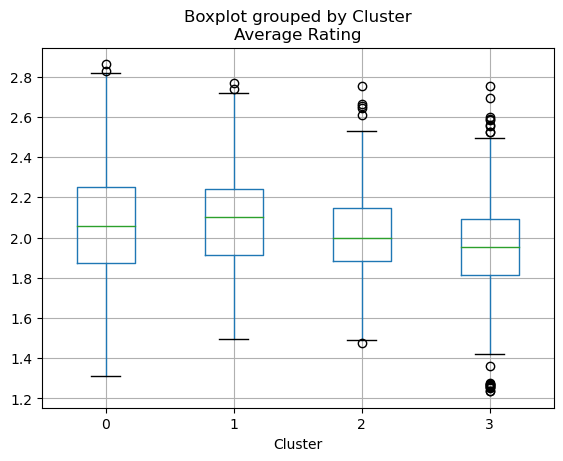

In [24]:
#show groups
df1.boxplot(column='Average Rating', by='Cluster')

#### tweet scrape

In [25]:
import tweepy
from datetime import date
# your bearer token
MY_BEARER_TOKEN = "AAAAAAAAAAAAAAAAAAAAAJqHlAEAAAAAQjvfrdz1zpvnpGa0hRwc8eOxv7s%3DptDvthEeyUB3RcY7OvK4AYFnPcu2SjAMcuxmYs3DZS11u3aiha"
# create your client 
client = tweepy.Client(bearer_token=MY_BEARER_TOKEN)


In [26]:
# query to search for tweets
from datetime import datetime

query = "traveling experience"

# your start and end time for fetching tweets
today = datetime.now()

end_time = datetime(today.year, today.month, today.day-1)
start_time = datetime(today.year, today.month, today.day-6)

# get tweets from the API
tweets = client.search_recent_tweets(query=query,
                                     start_time=start_time,
                                     end_time=end_time,
                                     tweet_fields = ["created_at", "text", "source"],
                                     user_fields = ["name", "username", "location", "verified", "description"],
                                     max_results = 100,
                                     expansions='author_id'
                                     )

In [27]:
# import the pandas library
import pandas as pd

# create a list of records
tweet_info_ls = []

# iterate over each tweet and corresponding user details
for tweet, user in zip(tweets.data, tweets.includes['users']):
    tweet_info = {
        'created_at': tweet.created_at,
        'text': tweet.text,
        'source': tweet.source,
        'name': user.name,
        'username': user.username,
        'location': user.location,
        'verified': user.verified,
        'description': user.description
    }
    tweet_info_ls.append(tweet_info)

# create dataframe from the extracted records
tweets_df = pd.DataFrame(tweet_info_ls)
# display the dataframe
tweets_df.head()

,created_at,text,source,name,username,location,verified,description
0,2023-01-08 23:59:17+00:00,RT @OlaCoker___: I really wanna experience tra...,None,ericomedia.dev 🦁.,Ericomedia,None,False,"Somewhere at the intersect of Tech, Media and ..."
1,2023-01-08 23:59:06+00:00,16. Experience the serenity of traveling alone...,None,#Quincy_theOG 🇿🇦/🇱🇸,_theOGQ,011...012...013...Location,False,Old Account @Quincy_theOG.\nNot Here To COMPET...
2,2023-01-08 23:58:37+00:00,RT @OlaCoker___: I really wanna experience tra...,None,United!!!,debzzzz1,None,False,jagbajantis!!!
3,2023-01-08 23:55:56+00:00,RT @naziaty: Traveling can be a difficult task...,None,Grinch,domohere,None,False,
4,2023-01-08 23:55:54+00:00,RT @OlaCoker___: I really wanna experience tra...,None,OF LONDON 🇬🇧,Uncut_Gemm,"England, United Kingdom",False,Muslimah- Incoming Alhaja.I don’t have anythin...


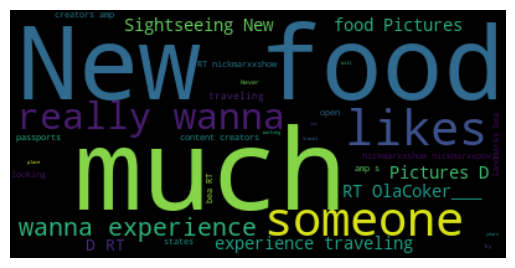

In [29]:
import textblob           
from textblob import TextBlob
from wordcloud import WordCloud 

# Extract the text and polarity scores of the tweets
tweet_texts = [tweet for tweet in tweets_df['text']]
polarity_scores = [TextBlob(tweet).sentiment.polarity for tweet in tweet_texts]

# Create a wordcloud plot of the most frequently used words in the tweets
wordcloud = WordCloud().generate(' '.join(tweet_texts))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

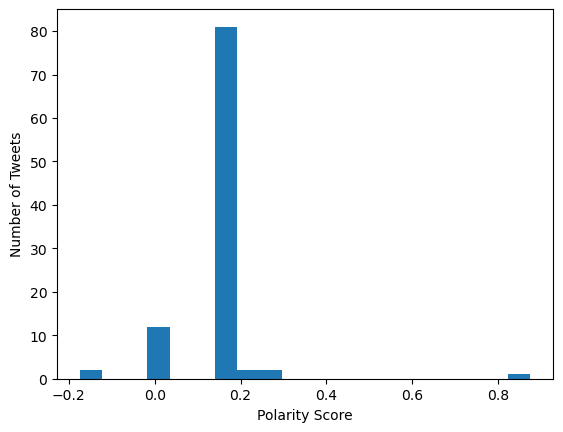

In [30]:
# Plot a bar chart showing the distribution of sentiment scores among the tweets
plt.hist(polarity_scores, bins=20)
plt.xlabel('Polarity Score')
plt.ylabel('Number of Tweets')
plt.show()